In [44]:
import numpy as np
import os
import imageio
from skimage.transform import resize, rescale
import datetime
import os
import matplotlib.pyplot as plt

In [45]:
import tensorflow as tf
print(tf.__version__)
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
tf.random.set_seed(30)

2.12.0


In [46]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [26]:
# !unzip "$/mnt/Project_data.zip" -d "$/home/Project_data.zip"

In [47]:
train_doc = np.random.permutation(open('/content/drive/MyDrive/Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('/content/drive/MyDrive/Project_data/val.csv').readlines())
batch_size = 8 #experiment with the batch size
num_classes = 5  #number of softmax classes

In [48]:
curr_dt_time = datetime.datetime.now()
train_path = '/content/drive/MyDrive/Project_data/train/'
val_path = '/content/drive/MyDrive/Project_data/val/'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)

# training sequences = 663
# validation sequences = 100


In [49]:
total_frames = 30
num_frames = 15
gestures = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, num_frames)).astype(int) #create a list of image numbers you want to use for a particular video

In [50]:
def plot_loss_accuracy(history):
    # list all data in history
    print(history.history.keys())
    # summarize history for accuracy
    plt.plot(history.history['categorical_accuracy'])
    plt.plot(history.history['val_categorical_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [51]:
def calculate_steps(num_train_sequences, num_val_sequences, batch_size):
    if (num_train_sequences%batch_size) == 0:
        steps_per_epoch = int(num_train_sequences/batch_size)
    else:
        steps_per_epoch = (num_train_sequences//batch_size) + 1

    if (num_val_sequences%batch_size) == 0:
        validation_steps = int(num_val_sequences/batch_size)
    else:
        validation_steps = (num_val_sequences//batch_size) + 1

    return steps_per_epoch,validation_steps

In [52]:
def model_callbacks(folder_name):
    model_name = str(folder_name) + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

    if not os.path.exists(model_name):
        os.mkdir(model_name)

    filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

    checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)

    LR = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.0001, cooldown=1, verbose=1) # write the REducelronplateau code here

    return [checkpoint, LR]

This is one of the most important part of the code. The overall structure of the generator has been given. In the generator, you are going to preprocess the images as you have images of 2 different dimensions as well as create a batch of video frames. You have to experiment with img_idx, y,z and normalization such that you get high accuracy.

/usr/local/lib/python3.10/dist-packages/keras/preprocessing/image.py:1444: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn(
<ipython-input-86-1d30d9113362>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image1 = imageio.imread("/content/drive/MyDrive/Project_data/val/WIN_20180907_15_42_25_Pro_Thumbs Down_new/WIN_20180907_15_42_25_Pro_00010.png")
<ipython-input-86-1d30d9113362>:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image2 = imageio.imread("/content/drive/MyDrive/Project_data/val/WIN_2018090

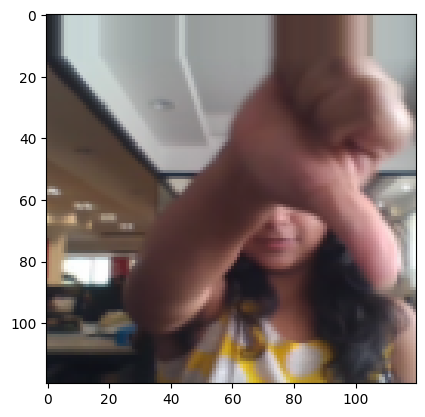

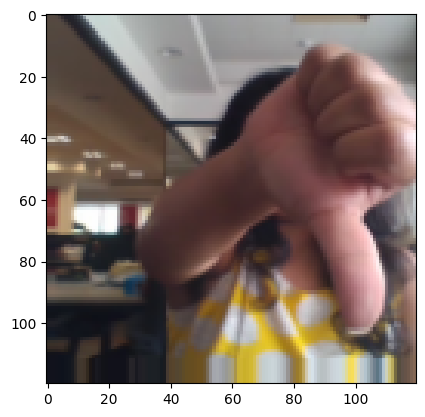

In [86]:
from keras.preprocessing.image import ImageDataGenerator
#from keras.preprocessing.image import smart_resize

datagen = ImageDataGenerator(
    zoom_range=0.1,
    zca_whitening=True,
    width_shift_range=0.1,
    height_shift_range=0.1)

image1 = imageio.imread("/content/drive/MyDrive/Project_data/val/WIN_20180907_15_42_25_Pro_Thumbs Down_new/WIN_20180907_15_42_25_Pro_00010.png")
image2 = imageio.imread("/content/drive/MyDrive/Project_data/val/WIN_20180907_15_42_25_Pro_Thumbs Down_new/WIN_20180907_15_42_25_Pro_00039.png")
image1 = resize(image1, (120, 120), anti_aliasing=True)
image1 = datagen.random_transform(image1)
plt.imshow(image1)
plt.show()
image2 = resize(image2, (120, 120), anti_aliasing=True)
image2 = datagen.random_transform(image2)
plt.imshow(image2)
plt.show()



In [54]:
def resize_crop_image(image):
    if image.shape[0] > 120 and image.shape[1] > 120:
        image = resize(image, (120, 120))

    height = image.shape[0]
    width = image.shape[1]
    height_center = height//2
    width_center = width//2
    image = image[(height_center-60):(height_center+70), (width_center-50):(width_center+70)]
    image = resize(image,(image_height, image_width))
    return image

from matplotlib import pyplot as plt

def show_resize_crop_image(paths):

    for index, path in enumerate(paths):
        plt.figure(figsize=(20,20))

        plt.subplot(5, 2, index*2+1)
        image = resize_crop_image(imread(path))
        plt.imshow(image)
        plt.title('Modified')

        plt.subplot(5, 2, index*2+2)
        plt.imshow(imread(path))
        plt.title('Original')

    plt.show()

Function to rescale and resize the original Image

In [55]:
import numpy as np
import os
from imageio import imread
from skimage.transform import resize
import datetime
import os

In [56]:
def generator(source_path, folder_list, batch_size):
    print('Source path = ', source_path, '; batch size =', batch_size)
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list) // batch_size
        for batch in range(num_batches):
            batch_data = np.zeros((batch_size, len(img_idx), image_height, image_width, 3))
            batch_labels = np.zeros((batch_size, gestures))

            for folder in range(batch_size):
                imgs = os.listdir(os.path.join(source_path, t[folder + (batch * batch_size)].split(';')[0]))
                print(imgs)

                for idx, item in enumerate(img_idx):
                    img_path = os.path.join(source_path, t[folder + (batch * batch_size)].strip().split(';')[0], imgs[item])
                    image = imread(img_path).astype(np.float32)
                    image = resize_crop_image(image)

                    batch_data[folder, idx, :, :, 0] = image[:, :, 0]
                    batch_data[folder, idx, :, :, 1] = image[:, :, 1]
                    batch_data[folder, idx, :, :, 2] = image[:, :, 2]

                batch_labels[folder, int(t[folder + (batch * batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels

        # Handling remaining data points
        if len(folder_list) % batch_size != 0:
            batch_size_remainder = len(folder_list) % batch_size

            for batch in range(batch_size_remainder):
                batch_data = np.zeros((batch_size_remainder, len(img_idx), image_height, image_width, 3))
                batch_labels = np.zeros((batch_size_remainder, gestures))

                for folder in range(batch_size_remainder):
                    imgs = os.listdir(os.path.join(source_path, t[folder + (num_batches * batch_size)].split(';')[0]))

                    for idx, item in enumerate(img_idx):
                        img_path = os.path.join(source_path, t[folder + (num_batches * batch_size)].strip().split(';')[0], imgs[item])
                        image = imread(img_path).astype(np.float32)
                        image = resize_crop_image(image)

                        batch_data[folder, idx, :, :, 0] = image[:, :, 0]
                        batch_data[folder, idx, :, :, 1] = image[:, :, 1]
                        batch_data[folder, idx, :, :, 2] = image[:, :, 2]

                    batch_labels[folder, int(t[folder + (num_batches * batch_size)].strip().split(';')[2])] = 1

                yield batch_data, batch_labels

Import libraries

In [57]:
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, GRU, LSTM, Flatten, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D, Conv2D, MaxPooling2D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras.regularizers import l2
from keras import optimizers

Build Model: Experiment 1

In [58]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Dropout, Flatten, BatchNormalization, Activation, Conv3D, MaxPooling3D
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import optimizers

#write your model here
model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

#softmax layer
model.add(Dense(gestures, activation='softmax'))

In [59]:
# compile it
model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['categorical_accuracy'])

# summary of model
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_6 (Conv3D)           (None, 15, 100, 100, 8)   656       
                                                                 
 batch_normalization_6 (Batc  (None, 15, 100, 100, 8)  32        
 hNormalization)                                                 
                                                                 
 activation_6 (Activation)   (None, 15, 100, 100, 8)   0         
                                                                 
 max_pooling3d_6 (MaxPooling  (None, 7, 50, 50, 8)     0         
 3D)                                                             
                                                                 
 conv3d_7 (Conv3D)           (None, 7, 50, 50, 16)     3472      
                                                                 
 batch_normalization_7 (Batc  (None, 7, 50, 50, 16)   

In [60]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [61]:
model_name = 'model_init_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

if not os.path.exists(model_name):
    os.mkdir(model_name)

filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [62]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [63]:
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=5, verbose=1,
                    callbacks=callbacks_list, validation_data=val_generator,
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)


Source path =  /content/drive/MyDrive/Project_data/train/ ; batch size = 8
['WIN_20180926_17_25_18_Pro_00015.png', 'WIN_20180926_17_25_18_Pro_00027.png', 'WIN_20180926_17_25_18_Pro_00013.png', 'WIN_20180926_17_25_18_Pro_00023.png', 'WIN_20180926_17_25_18_Pro_00005.png', 'WIN_20180926_17_25_18_Pro_00007.png', 'WIN_20180926_17_25_18_Pro_00017.png', 'WIN_20180926_17_25_18_Pro_00009.png', 'WIN_20180926_17_25_18_Pro_00019.png', 'WIN_20180926_17_25_18_Pro_00029.png', 'WIN_20180926_17_25_18_Pro_00011.png', 'WIN_20180926_17_25_18_Pro_00035.png', 'WIN_20180926_17_25_18_Pro_00003.png', 'WIN_20180926_17_25_18_Pro_00021.png', 'WIN_20180926_17_25_18_Pro_00033.png', 'WIN_20180926_17_25_18_Pro_00025.png', 'WIN_20180926_17_25_18_Pro_00031.png', 'WIN_20180926_17_25_18_Pro_00051.png', 'WIN_20180926_17_25_18_Pro_00039.png', 'WIN_20180926_17_25_18_Pro_00053.png', 'WIN_20180926_17_25_18_Pro_00059.png', 'WIN_20180926_17_25_18_Pro_00045.png', 'WIN_20180926_17_25_18_Pro_00049.png', 'WIN_20180926_17_25_18_Pro_

<ipython-input-56-6974d9b60e77>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(img_path).astype(np.float32)


['WIN_20180925_17_26_51_Pro_00009.png', 'WIN_20180925_17_26_51_Pro_00007.png', 'WIN_20180925_17_26_51_Pro_00003.png', 'WIN_20180925_17_26_51_Pro_00013.png', 'WIN_20180925_17_26_51_Pro_00015.png', 'WIN_20180925_17_26_51_Pro_00008.png', 'WIN_20180925_17_26_51_Pro_00014.png', 'WIN_20180925_17_26_51_Pro_00005.png', 'WIN_20180925_17_26_51_Pro_00012.png', 'WIN_20180925_17_26_51_Pro_00006.png', 'WIN_20180925_17_26_51_Pro_00004.png', 'WIN_20180925_17_26_51_Pro_00002.png', 'WIN_20180925_17_26_51_Pro_00010.png', 'WIN_20180925_17_26_51_Pro_00011.png', 'WIN_20180925_17_26_51_Pro_00020.png', 'WIN_20180925_17_26_51_Pro_00028.png', 'WIN_20180925_17_26_51_Pro_00021.png', 'WIN_20180925_17_26_51_Pro_00022.png', 'WIN_20180925_17_26_51_Pro_00023.png', 'WIN_20180925_17_26_51_Pro_00016.png', 'WIN_20180925_17_26_51_Pro_00018.png', 'WIN_20180925_17_26_51_Pro_00025.png', 'WIN_20180925_17_26_51_Pro_00027.png', 'WIN_20180925_17_26_51_Pro_00017.png', 'WIN_20180925_17_26_51_Pro_00024.png', 'WIN_20180925_17_26_51_P

<ipython-input-56-6974d9b60e77>:40: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(img_path).astype(np.float32)


83/83 [==============================] - ETA: 0s - loss: 1.9055 - categorical_accuracy: 0.2232Source path =  /content/drive/MyDrive/Project_data/val/ ; batch size = 8
['WIN_20180907_16_33_15_Pro_00001.png', 'WIN_20180907_16_33_15_Pro_00002.png', 'WIN_20180907_16_33_15_Pro_00019.png', 'WIN_20180907_16_33_15_Pro_00008.png', 'WIN_20180907_16_33_15_Pro_00018.png', 'WIN_20180907_16_33_15_Pro_00005.png', 'WIN_20180907_16_33_15_Pro_00027.png', 'WIN_20180907_16_33_15_Pro_00010.png', 'WIN_20180907_16_33_15_Pro_00023.png', 'WIN_20180907_16_33_15_Pro_00017.png', 'WIN_20180907_16_33_15_Pro_00022.png', 'WIN_20180907_16_33_15_Pro_00020.png', 'WIN_20180907_16_33_15_Pro_00003.png', 'WIN_20180907_16_33_15_Pro_00014.png', 'WIN_20180907_16_33_15_Pro_00011.png', 'WIN_20180907_16_33_15_Pro_00006.png', 'WIN_20180907_16_33_15_Pro_00016.png', 'WIN_20180907_16_33_15_Pro_00025.png', 'WIN_20180907_16_33_15_Pro_00012.png', 'WIN_20180907_16_33_15_Pro_00013.png', 'WIN_20180907_16_33_15_Pro_00021.png', 'WIN_20180907

Plot results

**Training Accuracy:** 0.33%

**Validation Accuracy:** 0.32%

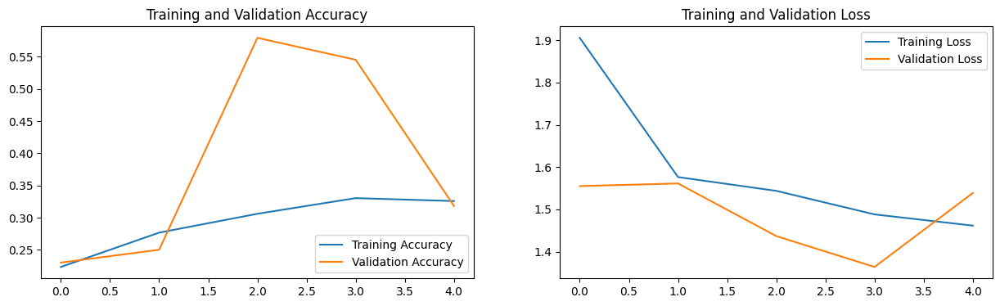

In [67]:
from IPython.display import Markdown, display
num_epochs = 5
def plot_history(history):
    display(Markdown("**Training Accuracy:** " + str(round(history.history['categorical_accuracy'][num_epochs-1], 2)) + "%"))
    display(Markdown("**Validation Accuracy:** " + str(round(history.history['val_categorical_accuracy'][num_epochs-1], 2)) + "%"))

    #print("Training Accuracy:" + history.history['categorical_accuracy'][num_epochs-1])
    #print("Validation Accuracy:" + history.history['val_categorical_accuracy'][num_epochs-1])

    acc = history.history['categorical_accuracy']
    val_acc = history.history['val_categorical_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(num_epochs)

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_history(history)

Experiment 2:

In [69]:
total_frames = 30
num_frames = 15
gestures = 5
image_height = 50
image_width = 50
img_idx = np.round(np.linspace(0, total_frames-1, num_frames)).astype(int)

num_epochs=10


In [70]:
#write your model here
model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

#softmax layer
model.add(Dense(gestures, activation='softmax'))

In [71]:
# compile it
model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['categorical_accuracy'])
# summary of model
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_9 (Conv3D)           (None, 15, 50, 50, 8)     656       
                                                                 
 batch_normalization_9 (Batc  (None, 15, 50, 50, 8)    32        
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 15, 50, 50, 8)     0         
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 7, 25, 25, 8)     0         
 3D)                                                             
                                                                 
 conv3d_10 (Conv3D)          (None, 7, 25, 25, 16)     3472      
                                                                 
 batch_normalization_10 (Bat  (None, 7, 25, 25, 16)   

In [72]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [73]:
model_name = 'exp2' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

if not os.path.exists(model_name):
    os.mkdir(model_name)

filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [74]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [75]:
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1,
                    callbacks=callbacks_list, validation_data=val_generator,
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /content/drive/MyDrive/Project_data/train/ ; batch size = 8
['WIN_20180925_17_44_26_Pro_00008.png', 'WIN_20180925_17_44_26_Pro_00014.png', 'WIN_20180925_17_44_26_Pro_00006.png', 'WIN_20180925_17_44_26_Pro_00004.png', 'WIN_20180925_17_44_26_Pro_00002.png', 'WIN_20180925_17_44_26_Pro_00000.png', 'WIN_20180925_17_44_26_Pro_00012.png', 'WIN_20180925_17_44_26_Pro_00010.png', 'WIN_20180925_17_44_26_Pro_00026.png', 'WIN_20180925_17_44_26_Pro_00056.png', 'WIN_20180925_17_44_26_Pro_00020.png', 'WIN_20180925_17_44_26_Pro_00048.png', 'WIN_20180925_17_44_26_Pro_00036.png', 'WIN_20180925_17_44_26_Pro_00016.png', 'WIN_20180925_17_44_26_Pro_00058.png', 'WIN_20180925_17_44_26_Pro_00022.png', 'WIN_20180925_17_44_26_Pro_00042.png', 'WIN_20180925_17_44_26_Pro_00034.png', 'WIN_20180925_17_44_26_Pro_00028.png', 'WIN_20180925_17_44_26_Pro_00050.png', 'WIN_20180925_17_44_26_Pro_00044.png', 'WIN_20180925_17_44_26_Pro_00030.png', 'WIN_20180925_17_44_26_Pro_00040.png', 'WIN_20180925_17_44_26_Pro_

<ipython-input-56-6974d9b60e77>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(img_path).astype(np.float32)


['WIN_20180925_17_51_23_Pro_00038.png', 'WIN_20180925_17_51_23_Pro_00028.png', 'WIN_20180925_17_51_23_Pro_00036.png', 'WIN_20180925_17_51_23_Pro_00018.png', 'WIN_20180925_17_51_23_Pro_00022.png', 'WIN_20180925_17_51_23_Pro_00034.png', 'WIN_20180925_17_51_23_Pro_00030.png', 'WIN_20180925_17_51_23_Pro_00024.png', 'WIN_20180925_17_51_23_Pro_00020.png', 'WIN_20180925_17_51_23_Pro_00026.png', 'WIN_20180925_17_51_23_Pro_00014.png', 'WIN_20180925_17_51_23_Pro_00012.png', 'WIN_20180925_17_51_23_Pro_00010.png', 'WIN_20180925_17_51_23_Pro_00032.png', 'WIN_20180925_17_51_23_Pro_00016.png', 'WIN_20180925_17_51_23_Pro_00040.png', 'WIN_20180925_17_51_23_Pro_00062.png', 'WIN_20180925_17_51_23_Pro_00054.png', 'WIN_20180925_17_51_23_Pro_00044.png', 'WIN_20180925_17_51_23_Pro_00052.png', 'WIN_20180925_17_51_23_Pro_00066.png', 'WIN_20180925_17_51_23_Pro_00050.png', 'WIN_20180925_17_51_23_Pro_00060.png', 'WIN_20180925_17_51_23_Pro_00058.png', 'WIN_20180925_17_51_23_Pro_00048.png', 'WIN_20180925_17_51_23_P

<ipython-input-56-6974d9b60e77>:40: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(img_path).astype(np.float32)


Streaming output truncated to the last 5000 lines.
['WIN_20180926_17_34_37_Pro_00012.png', 'WIN_20180926_17_34_37_Pro_00008.png', 'WIN_20180926_17_34_37_Pro_00006.png', 'WIN_20180926_17_34_37_Pro_00016.png', 'WIN_20180926_17_34_37_Pro_00014.png', 'WIN_20180926_17_34_37_Pro_00010.png', 'WIN_20180926_17_34_37_Pro_00004.png', 'WIN_20180926_17_34_37_Pro_00054.png', 'WIN_20180926_17_34_37_Pro_00034.png', 'WIN_20180926_17_34_37_Pro_00020.png', 'WIN_20180926_17_34_37_Pro_00022.png', 'WIN_20180926_17_34_37_Pro_00036.png', 'WIN_20180926_17_34_37_Pro_00024.png', 'WIN_20180926_17_34_37_Pro_00046.png', 'WIN_20180926_17_34_37_Pro_00050.png', 'WIN_20180926_17_34_37_Pro_00058.png', 'WIN_20180926_17_34_37_Pro_00028.png', 'WIN_20180926_17_34_37_Pro_00052.png', 'WIN_20180926_17_34_37_Pro_00040.png', 'WIN_20180926_17_34_37_Pro_00032.png', 'WIN_20180926_17_34_37_Pro_00026.png', 'WIN_20180926_17_34_37_Pro_00048.png', 'WIN_20180926_17_34_37_Pro_00044.png', 'WIN_20180926_17_34_37_Pro_00062.png', 'WIN_2018092

**Training Accuracy:** 0.4%

**Validation Accuracy:** 0.42%

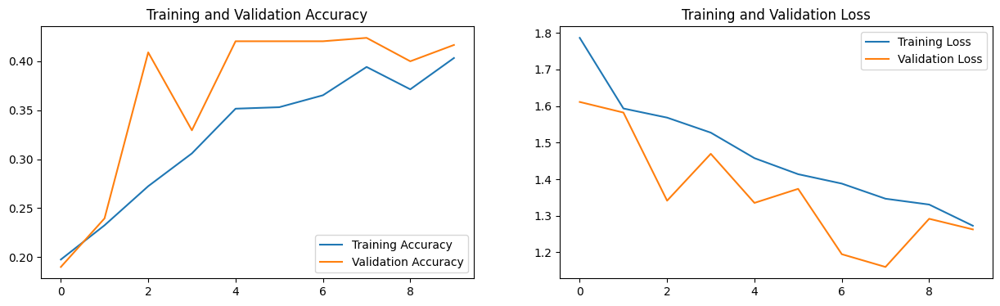

In [76]:
plot_history(history)

**Training Accuracy:** 0.49%

**Validation Accuracy:** 0.62%

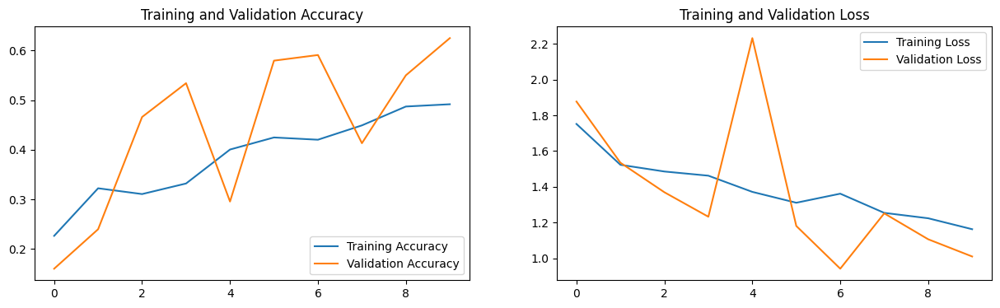

Experiment 2

In [77]:
# Change the number of epochs

total_frames = 30
num_frames = 15
gestures = 5
image_height = 50
image_width = 50
img_idx = np.round(np.linspace(0, total_frames-1, num_frames)).astype(int)

num_epochs=10

Build a model

In [78]:

model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

#softmax layer
model.add(Dense(gestures, activation='softmax'))

In [79]:
# compile it
model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['categorical_accuracy'])
# summary of model
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_12 (Conv3D)          (None, 15, 50, 50, 8)     656       
                                                                 
 batch_normalization_12 (Bat  (None, 15, 50, 50, 8)    32        
 chNormalization)                                                
                                                                 
 activation_12 (Activation)  (None, 15, 50, 50, 8)     0         
                                                                 
 max_pooling3d_12 (MaxPoolin  (None, 7, 25, 25, 8)     0         
 g3D)                                                            
                                                                 
 conv3d_13 (Conv3D)          (None, 7, 25, 25, 16)     3472      
                                                                 
 batch_normalization_13 (Bat  (None, 7, 25, 25, 16)   

In [80]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [83]:
model_name = 'exp3' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

if not os.path.exists(model_name):
    os.mkdir(model_name)

filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [82]:
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1,
                    callbacks=callbacks_list, validation_data=val_generator,
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /content/drive/MyDrive/Project_data/train/ ; batch size = 8
['WIN_20180925_17_41_24_Pro_00015.png', 'WIN_20180925_17_41_24_Pro_00028.png', 'WIN_20180925_17_41_24_Pro_00036.png', 'WIN_20180925_17_41_24_Pro_00038.png', 'WIN_20180925_17_41_24_Pro_00018.png', 'WIN_20180925_17_41_24_Pro_00037.png', 'WIN_20180925_17_41_24_Pro_00034.png', 'WIN_20180925_17_41_24_Pro_00016.png', 'WIN_20180925_17_41_24_Pro_00023.png', 'WIN_20180925_17_41_24_Pro_00027.png', 'WIN_20180925_17_41_24_Pro_00013.png', 'WIN_20180925_17_41_24_Pro_00032.png', 'WIN_20180925_17_41_24_Pro_00022.png', 'WIN_20180925_17_41_24_Pro_00029.png', 'WIN_20180925_17_41_24_Pro_00025.png', 'WIN_20180925_17_41_24_Pro_00024.png', 'WIN_20180925_17_41_24_Pro_00031.png', 'WIN_20180925_17_41_24_Pro_00040.png', 'WIN_20180925_17_41_24_Pro_00019.png', 'WIN_20180925_17_41_24_Pro_00039.png', 'WIN_20180925_17_41_24_Pro_00035.png', 'WIN_20180925_17_41_24_Pro_00026.png', 'WIN_20180925_17_41_24_Pro_00033.png', 'WIN_20180925_17_41_24_Pro_

<ipython-input-56-6974d9b60e77>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(img_path).astype(np.float32)


['WIN_20180907_16_43_19_Pro_00004.png', 'WIN_20180907_16_43_19_Pro_00018.png', 'WIN_20180907_16_43_19_Pro_00007.png', 'WIN_20180907_16_43_19_Pro_00010.png', 'WIN_20180907_16_43_19_Pro_00020.png', 'WIN_20180907_16_43_19_Pro_00017.png', 'WIN_20180907_16_43_19_Pro_00003.png', 'WIN_20180907_16_43_19_Pro_00008.png', 'WIN_20180907_16_43_19_Pro_00015.png', 'WIN_20180907_16_43_19_Pro_00002.png', 'WIN_20180907_16_43_19_Pro_00012.png', 'WIN_20180907_16_43_19_Pro_00005.png', 'WIN_20180907_16_43_19_Pro_00009.png', 'WIN_20180907_16_43_19_Pro_00014.png', 'WIN_20180907_16_43_19_Pro_00013.png', 'WIN_20180907_16_43_19_Pro_00016.png', 'WIN_20180907_16_43_19_Pro_00011.png', 'WIN_20180907_16_43_19_Pro_00019.png', 'WIN_20180907_16_43_19_Pro_00006.png', 'WIN_20180907_16_43_19_Pro_00024.png', 'WIN_20180907_16_43_19_Pro_00023.png', 'WIN_20180907_16_43_19_Pro_00029.png', 'WIN_20180907_16_43_19_Pro_00022.png', 'WIN_20180907_16_43_19_Pro_00030.png', 'WIN_20180907_16_43_19_Pro_00026.png', 'WIN_20180907_16_43_19_P

<ipython-input-56-6974d9b60e77>:40: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(img_path).astype(np.float32)


Streaming output truncated to the last 5000 lines.
['WIN_20180925_18_06_24_Pro_00015.png', 'WIN_20180925_18_06_24_Pro_00019.png', 'WIN_20180925_18_06_24_Pro_00017.png', 'WIN_20180925_18_06_24_Pro_00016.png', 'WIN_20180925_18_06_24_Pro_00018.png', 'WIN_20180925_18_06_24_Pro_00031.png', 'WIN_20180925_18_06_24_Pro_00028.png', 'WIN_20180925_18_06_24_Pro_00027.png', 'WIN_20180925_18_06_24_Pro_00044.png', 'WIN_20180925_18_06_24_Pro_00025.png', 'WIN_20180925_18_06_24_Pro_00026.png', 'WIN_20180925_18_06_24_Pro_00022.png', 'WIN_20180925_18_06_24_Pro_00023.png', 'WIN_20180925_18_06_24_Pro_00034.png', 'WIN_20180925_18_06_24_Pro_00035.png', 'WIN_20180925_18_06_24_Pro_00020.png', 'WIN_20180925_18_06_24_Pro_00030.png', 'WIN_20180925_18_06_24_Pro_00041.png', 'WIN_20180925_18_06_24_Pro_00043.png', 'WIN_20180925_18_06_24_Pro_00039.png', 'WIN_20180925_18_06_24_Pro_00042.png', 'WIN_20180925_18_06_24_Pro_00033.png', 'WIN_20180925_18_06_24_Pro_00038.png', 'WIN_20180925_18_06_24_Pro_00024.png', 'WIN_2018092

Plot outputs

**Training Accuracy:** 0.49%

**Validation Accuracy:** 0.62%

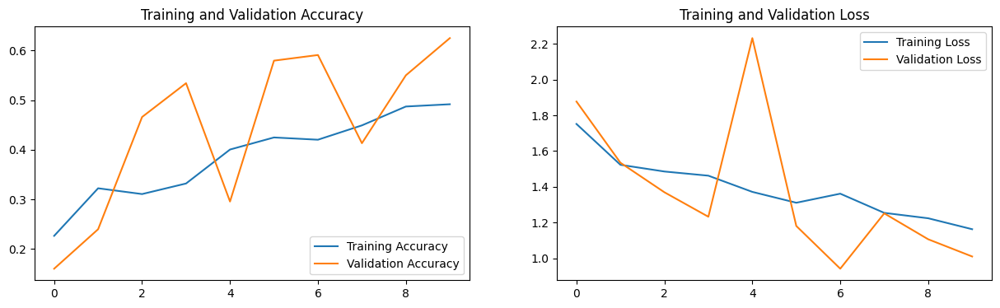

In [85]:
plot_history(history)